In [1]:
# Install dependencies (run once)
import subprocess, sys
subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'torch', 'torchvision', '--quiet'])
subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'Pillow', '--quiet'])

import os
os.makedirs('data/colours', exist_ok=True)
os.makedirs('outputs/colourization_cnn', exist_ok=True)
os.makedirs('outputs/colourization_unet', exist_ok=True)
print('Setup complete.')



Setup complete.


In [2]:

import os
from six.moves.urllib.request import urlretrieve
import tarfile
import numpy as np
import pickle
import sys
from PIL import Image


def get_file(fname,
             origin,
             untar=False,
             extract=False,
             archive_format='auto',
             cache_dir='data'):
    datadir = os.path.join(cache_dir)
    if not os.path.exists(datadir):
        os.makedirs(datadir)

    if untar:
        untar_fpath = os.path.join(datadir, fname)
        fpath = untar_fpath + '.tar.gz'
    else:
        fpath = os.path.join(datadir, fname)
    
    print(fpath)
    if not os.path.exists(fpath):
        print('Downloading data from', origin)

        error_msg = 'URL fetch failure on {}: {} -- {}'
        try:
            try:
                urlretrieve(origin, fpath)
            except URLError as e:
                raise Exception(error_msg.format(origin, e.errno, e.reason))
            except HTTPError as e:
                raise Exception(error_msg.format(origin, e.code, e.msg))
        except (Exception, KeyboardInterrupt) as e:
            if os.path.exists(fpath):
                os.remove(fpath)
            raise

    if untar:
        if not os.path.exists(untar_fpath):
            print('Extracting file.')
            with tarfile.open(fpath) as archive:
                archive.extractall(datadir)
        return untar_fpath

    if extract:
        _extract_archive(fpath, datadir, archive_format)

    return fpath



def load_batch(fpath, label_key='labels'):
    """Internal utility for parsing CIFAR data.
    # Arguments
        fpath: path the file to parse.
        label_key: key for label data in the retrieve
            dictionary.
    # Returns
        A tuple `(data, labels)`.
    """
    f = open(fpath, 'rb')
    if sys.version_info < (3,):
        d = pickle.load(f)
    else:
        d = pickle.load(f, encoding='bytes')
        # decode utf8
        d_decoded = {}
        for k, v in d.items():
            d_decoded[k.decode('utf8')] = v
        d = d_decoded
    f.close()
    data = d['data']
    labels = d[label_key]

    data = data.reshape(data.shape[0], 3, 32, 32)
    return data, labels

def load_cifar10(transpose=False):
    """Loads CIFAR10 dataset.
    # Returns
        Tuple of Numpy arrays: `(x_train, y_train), (x_test, y_test)`.
    """
    dirname = 'cifar-10-batches-py'
    origin = 'http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz'
    path = get_file(dirname, origin=origin, untar=True)

    num_train_samples = 50000

    x_train = np.zeros((num_train_samples, 3, 32, 32), dtype='uint8')
    y_train = np.zeros((num_train_samples,), dtype='uint8')

    for i in range(1, 6):
        fpath = os.path.join(path, 'data_batch_' + str(i))
        data, labels = load_batch(fpath)
        x_train[(i - 1) * 10000: i * 10000, :, :, :] = data
        y_train[(i - 1) * 10000: i * 10000] = labels

    fpath = os.path.join(path, 'test_batch')
    x_test, y_test = load_batch(fpath)

    y_train = np.reshape(y_train, (len(y_train), 1))
    y_test = np.reshape(y_test, (len(y_test), 1))

    if transpose:
        x_train = x_train.transpose(0, 2, 3, 1)
        x_test = x_test.transpose(0, 2, 3, 1)
    return (x_train, y_train), (x_test, y_test)


In [3]:
# ── IMPORTANT ─────────────────────────────────────────────────────────────
# Place colour_kmeans24_cat7.npy in:  data/colours/colour_kmeans24_cat7.npy
# ───────────────────────────────────────────────────────────────────────────
import shutil, os
# If the npy file is in the same folder as this notebook, copy it automatically
npy_src = 'colour_kmeans24_cat7.npy'
npy_dst = 'data/colours/colour_kmeans24_cat7.npy'
if os.path.exists(npy_src) and not os.path.exists(npy_dst):
    shutil.copy(npy_src, npy_dst)
    print(f'Copied {npy_src} -> {npy_dst}')
elif os.path.exists(npy_dst):
    print(f'Colours file found at {npy_dst} ✓')
else:
    print('WARNING: colour_kmeans24_cat7.npy not found!')
    print('Place it in the same folder as this notebook.')

# Download CIFAR-10
m = load_cifar10()
print('CIFAR-10 loaded.')


Colours file found at data/colours/colour_kmeans24_cat7.npy ✓
data\cifar-10-batches-py.tar.gz
CIFAR-10 loaded.


C:\Users\navee\AppData\Local\Temp\ipykernel_27052\2782361662.py:70: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  d = pickle.load(f, encoding='bytes')


# Code for training and CNN models

## Data preprocessing

In [4]:
"""
Colourization of CIFAR-10 Horses via classification.
"""
from __future__ import print_function
import argparse
import math
import numpy as np
import numpy.random as npr
from PIL import Image  # replaces deprecated scipy.misc
import time
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import matplotlib
import matplotlib.pyplot as plt 


#from load_data import load_cifar10

HORSE_CATEGORY = 7

######################################################################
# Data related code
######################################################################
def get_rgb_cat(xs, colours):
    """
    Get colour categories given RGB values. This function doesn't
    actually do the work, instead it splits the work into smaller
    chunks that can fit into memory, and calls helper function
    _get_rgb_cat

    Args:
      xs: float numpy array of RGB images in [B, C, H, W] format
      colours: numpy array of colour categories and their RGB values
    Returns:
      result: int numpy array of shape [B, 1, H, W]
    """
    if np.shape(xs)[0] < 100:
        return _get_rgb_cat(xs)
    batch_size = 100
    nexts = []
    for i in range(0, np.shape(xs)[0], batch_size):
        next = _get_rgb_cat(xs[i:i+batch_size,:,:,:], colours)
        nexts.append(next)
    result = np.concatenate(nexts, axis=0)
    return result

def _get_rgb_cat(xs, colours):
    """
    Get colour categories given RGB values. This is done by choosing
    the colour in `colours` that is the closest (in RGB space) to
    each point in the image `xs`. This function is a little memory
    intensive, and so the size of `xs` should not be too large.

    Args:
      xs: float numpy array of RGB images in [B, C, H, W] format
      colours: numpy array of colour categories and their RGB values
    Returns:
      result: int numpy array of shape [B, 1, H, W]
    """
    num_colours = np.shape(colours)[0]
    xs = np.expand_dims(xs, 0)
    cs = np.reshape(colours, [num_colours,1,3,1,1])
    dists = np.linalg.norm(xs-cs, axis=2) # 2 = colour axis
    cat = np.argmin(dists, axis=0)
    cat = np.expand_dims(cat, axis=1)
    return cat

def get_cat_rgb(cats, colours):
    """
    Get RGB colours given the colour categories

    Args:
      cats: integer numpy array of colour categories
      colours: numpy array of colour categories and their RGB values
    Returns:
      numpy tensor of RGB colours
    """
    return colours[cats]

def process(xs, ys, max_pixel=256.0, downsize_input=False):
    """
    Pre-process CIFAR10 images by taking only the horse category,
    shuffling, and have colour values be bound between 0 and 1

    Args:
      xs: the colour RGB pixel values
      ys: the category labels
      max_pixel: maximum pixel value in the original data
    Returns:
      xs: value normalized and shuffled colour images
      grey: greyscale images, also normalized so values are between 0 and 1
    """
    xs = xs / max_pixel
    xs = xs[np.where(ys == HORSE_CATEGORY)[0], :, :, :]
    npr.shuffle(xs)
    
    grey = np.mean(xs, axis=1, keepdims=True)

    if downsize_input:
      downsize_module = nn.Sequential(nn.AvgPool2d(2),
                               nn.AvgPool2d(2), 
                               nn.Upsample(scale_factor=2), 
                               nn.Upsample(scale_factor=2))
      xs_downsized = downsize_module.forward(torch.from_numpy(xs).float())
      xs_downsized = xs_downsized.data.numpy()
      return (xs, xs_downsized)
    else:
      return (xs, grey)


def get_batch(x, y, batch_size):
    '''
    Generated that yields batches of data

    Args:
      x: input values
      y: output values
      batch_size: size of each batch
    Yields:
      batch_x: a batch of inputs of size at most batch_size
      batch_y: a batch of outputs of size at most batch_size
    '''
    N = np.shape(x)[0]
    assert N == np.shape(y)[0]
    for i in range(0, N, batch_size):
        batch_x = x[i:i+batch_size, :,:,:]
        batch_y = y[i:i+batch_size, :,:,:]
        yield (batch_x, batch_y)

######################################################################
# Torch Helper
######################################################################

def get_torch_vars(xs, ys, gpu=False):
    """
    Helper function to convert numpy arrays to pytorch tensors.
    If GPU is used, move the tensors to GPU.

    Args:
      xs (float numpy tenosor): greyscale input
      ys (int numpy tenosor): categorical labels 
      gpu (bool): whether to move pytorch tensor to GPU
    Returns:
      Variable(xs), Variable(ys)
    """
    xs = torch.from_numpy(xs).float()
    ys = torch.from_numpy(ys).long()
    if gpu:
        xs = xs.cuda()
        ys = ys.cuda()
    return Variable(xs), Variable(ys)

def compute_loss(criterion, outputs, labels, batch_size, num_colours):
    """
    Helper function to compute the loss. Since this is a pixelwise
    prediction task we need to reshape the output and ground truth
    tensors into a 2D tensor before passing it in to the loss criteron.

    Args:
      criterion: pytorch loss criterion
      outputs (pytorch tensor): predicted labels from the model
      labels (pytorch tensor): ground truth labels
      batch_size (int): batch size used for training
      num_colours (int): number of colour categories
    Returns:
      pytorch tensor for loss
    """

    loss_out = outputs.transpose(1,3) \
                      .contiguous() \
                      .view([batch_size*32*32, num_colours])
    loss_lab = labels.transpose(1,3) \
                      .contiguous() \
                      .view([batch_size*32*32])
    return criterion(loss_out, loss_lab)

def run_validation_step(cnn, criterion, test_grey, test_rgb_cat, batch_size,
                        colours, plotpath=None, visualize=True, downsize_input=False):
    correct = 0.0
    total = 0.0
    losses = []
    num_colours = np.shape(colours)[0]
    for i, (xs, ys) in enumerate(get_batch(test_grey,
                                           test_rgb_cat,
                                           batch_size)):
        images, labels = get_torch_vars(xs, ys, args.gpu)
        outputs = cnn(images)

        val_loss = compute_loss(criterion,
                                outputs,
                                labels,
                                batch_size=args.batch_size,
                                num_colours=num_colours)
        losses.append(val_loss.data.item())

        _, predicted = torch.max(outputs.data, 1, keepdim=True)
        total += labels.size(0) * 32 * 32
        correct += (predicted == labels.data).sum()

    if plotpath: # only plot if a path is provided
        plot(xs, ys, predicted.cpu().numpy(), colours, 
             plotpath, visualize=visualize, compare_bilinear=downsize_input)

    val_loss = np.mean(losses)
    val_acc = 100 * correct / total
    return val_loss, val_acc


## Visualization

In [5]:
def plot(input, gtlabel, output, colours, path, visualize, compare_bilinear=False):
    """
    Generate png plots of input, ground truth, and outputs

    Args:
      input: the greyscale input to the colourization CNN
      gtlabel: the grouth truth categories for each pixel
      output: the predicted categories for each pixel
      colours: numpy array of colour categories and their RGB values
      path: output path
      visualize: display the figures inline or save the figures in path
    """
    grey = np.transpose(input[:10,:,:,:], [0,2,3,1])
    gtcolor = get_cat_rgb(gtlabel[:10,0,:,:], colours)
    predcolor = get_cat_rgb(output[:10,0,:,:], colours)

    img_stack = [
      np.hstack(np.tile(grey, [1,1,1,3])),
      np.hstack(gtcolor),
      np.hstack(predcolor)]
    
    if compare_bilinear:
      downsize_module = nn.Sequential(nn.AvgPool2d(2),
                                 nn.AvgPool2d(2), 
                                 nn.Upsample(scale_factor=2, mode='bilinear'), 
                                 nn.Upsample(scale_factor=2, mode='bilinear'))
      gt_input = np.transpose(gtcolor, [0, 3, 1, 2,])
      color_bilinear = downsize_module.forward(torch.from_numpy(gt_input).float())
      color_bilinear = np.transpose(color_bilinear.data.numpy(), [0, 2, 3, 1])
      img_stack = [
        np.hstack(np.transpose(input[:10,:,:,:], [0,2,3,1])),
        np.hstack(gtcolor),
        np.hstack(predcolor),
        np.hstack(color_bilinear)]
    img = np.vstack(img_stack)
    
    plt.grid('off')
    plt.imshow(img, vmin=0., vmax=1.)
    if visualize:
      plt.show()
    else:
      plt.savefig(path)

def toimage(img, cmin, cmax):
    return Image.fromarray((img.clip(cmin, cmax)*255).astype(np.uint8))
  
def plot_activation(args, cnn):
    # LOAD THE COLOURS CATEGORIES
    colours = np.load(args.colours, allow_pickle=True, encoding='latin1')[0]
    num_colours = np.shape(colours)[0]
    
    (x_train, y_train), (x_test, y_test) = load_cifar10()
    test_rgb, test_grey = process(x_test, y_test, downsize_input = args.downsize_input)
    test_rgb_cat = get_rgb_cat(test_rgb, colours)
    
    # Take the idnex of the test image
    id = args.index
    outdir = "outputs/" + args.experiment_name + '/act' + str(id)
    if not os.path.exists(outdir):
      os.makedirs(outdir)
    images, labels = get_torch_vars(np.expand_dims(test_grey[id], 0),
                                    np.expand_dims(test_rgb_cat[id], 0))
    cnn.cpu()
    outputs = cnn(images)
    _, predicted = torch.max(outputs.data, 1, keepdim=True)
    predcolor = get_cat_rgb(predicted.cpu().numpy()[0,0,:,:], colours)
    img = predcolor
    toimage(predcolor, cmin=0, cmax=1) \
            .save(os.path.join(outdir, "output_%d.png" % id))

    if not args.downsize_input:
      img = np.tile(np.transpose(test_grey[id], [1,2,0]), [1,1,3])
    else:
      img = np.transpose(test_grey[id], [1,2,0])
    toimage(img, cmin=0, cmax=1) \
            .save(os.path.join(outdir, "input_%d.png" % id))

    img = np.transpose(test_rgb[id], [1,2,0])
    toimage(img, cmin=0, cmax=1) \
            .save(os.path.join(outdir, "input_%d_gt.png" % id))

    
    def add_border(img):
        return np.pad(img, 1, "constant", constant_values=1.0)

    def draw_activations(path, activation, imgwidth=4):
        img = np.vstack([
            np.hstack([
                add_border(filter) for filter in
                activation[i*imgwidth:(i+1)*imgwidth,:,:]])
            for i in range(activation.shape[0] // imgwidth)])
        scipy.misc.imsave(path, img)


    for i, tensor in enumerate([cnn.out1, cnn.out2, cnn.out3, cnn.out4, cnn.out5]):
        draw_activations(
            os.path.join(outdir, "conv%d_out_%d.png" % (i+1, id)),
            tensor.data.cpu().numpy()[0])
    print("visualization results are saved to %s"%outdir)

## Training

In [6]:
class AttrDict(dict):
    def __init__(self, *args, **kwargs):
        super(AttrDict, self).__init__(*args, **kwargs)
        self.__dict__ = self

def train(args, cnn=None):
    # Set the maximum number of threads to prevent crash in Teaching Labs
    torch.set_num_threads(5)
    # Numpy random seed
    npr.seed(args.seed)
    
    # Save directory
    save_dir = "outputs/" + args.experiment_name

    # LOAD THE COLOURS CATEGORIES
    colours = np.load(args.colours, allow_pickle=True, encoding='latin1')[0]
    num_colours = np.shape(colours)[0]
    # INPUT CHANNEL
    num_in_channels = 1 if not args.downsize_input else 3
    # LOAD THE MODEL
    if cnn is None:
      if args.model == "CNN":
          cnn = CNN(args.kernel, args.num_filters, num_colours, num_in_channels)
      elif args.model == "UNet":
          cnn = UNet(args.kernel, args.num_filters, num_colours, num_in_channels)

    # LOSS FUNCTION
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(cnn.parameters(), lr=args.learn_rate)

    # DATA
    print("Loading data...")
    (x_train, y_train), (x_test, y_test) = load_cifar10()

    print("Transforming data...")
    train_rgb, train_grey = process(x_train, y_train, downsize_input = args.downsize_input)
    train_rgb_cat = get_rgb_cat(train_rgb, colours)
    test_rgb, test_grey = process(x_test, y_test, downsize_input = args.downsize_input)
    test_rgb_cat = get_rgb_cat(test_rgb, colours)

    # Create the outputs folder if not created already
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    print("Beginning training ...")
    if args.gpu: cnn.cuda()
    start = time.time()

    train_losses = []
    valid_losses = []
    valid_accs = []
    for epoch in range(args.epochs):
        # Train the Model
        cnn.train() # Change model to 'train' mode
        losses = []
        for i, (xs, ys) in enumerate(get_batch(train_grey,
                                               train_rgb_cat,
                                               args.batch_size)):
            images, labels = get_torch_vars(xs, ys, args.gpu)
            # Forward + Backward + Optimize
            optimizer.zero_grad()
            outputs = cnn(images)

            loss = compute_loss(criterion,
                                outputs,
                                labels,
                                batch_size=args.batch_size,
                                num_colours=num_colours)
            loss.backward()
            optimizer.step()
            losses.append(loss.data.item())

        # plot training images
        if args.plot:
            _, predicted = torch.max(outputs.data, 1, keepdim=True)
            plot(xs, ys, predicted.cpu().numpy(), colours,
                 save_dir+'/train_%d.png' % epoch, 
                 args.visualize, 
                 args.downsize_input)

        # plot training images
        avg_loss = np.mean(losses)
        train_losses.append(avg_loss)
        time_elapsed = time.time() - start
        print('Epoch [%d/%d], Loss: %.4f, Time (s): %d' % (
            epoch+1, args.epochs, avg_loss, time_elapsed))

        # Evaluate the model
        cnn.eval()  # Change model to 'eval' mode (BN uses moving mean/var).
        val_loss, val_acc = run_validation_step(cnn,
                                                criterion,
                                                test_grey,
                                                test_rgb_cat,
                                                args.batch_size,
                                                colours,
                                                save_dir+'/test_%d.png' % epoch,
                                                args.visualize,
                                                args.downsize_input)

        time_elapsed = time.time() - start
        valid_losses.append(val_loss)
        valid_accs.append(val_acc)
        print('Epoch [%d/%d], Val Loss: %.4f, Val Acc: %.1f%%, Time(s): %d' % (
            epoch+1, args.epochs, val_loss, val_acc, time_elapsed))
    
    # Plot training curve
    plt.figure()
    plt.plot(train_losses, "ro-", label="Train")
    plt.plot(valid_losses, "go-", label="Validation")
    plt.legend()
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.savefig(save_dir+"/training_curve.png")

    if args.checkpoint:
        print('Saving model...')
        torch.save(cnn.state_dict(), args.checkpoint)
    
    return cnn

## Convolutional neural networks (your code goes here)

In [7]:
######################################################################
# MODELS
######################################################################

class MyConv2d(nn.Module):
    """
    Simplified custom implementation of nn.Conv2d for 2D convolution.
    """
    def __init__(self, in_channels, out_channels, kernel_size, padding=None):
        super(MyConv2d, self).__init__()
        self.in_channels  = in_channels
        self.out_channels = out_channels
        self.kernel_size  = kernel_size
        self.padding = kernel_size // 2 if padding is None else padding
        self.weight = nn.parameter.Parameter(torch.Tensor(
            out_channels, in_channels, kernel_size, kernel_size))
        self.bias = nn.parameter.Parameter(torch.Tensor(out_channels))
        self.reset_parameters()

    def reset_parameters(self):
        n = self.in_channels * self.kernel_size * self.kernel_size
        stdv = 1. / math.sqrt(n)
        self.weight.data.uniform_(-stdv, stdv)
        self.bias.data.uniform_(-stdv, stdv)

    def forward(self, x):
        return F.conv2d(x, self.weight, self.bias, padding=self.padding)


class CNN(nn.Module):
    """
    Classification-based CNN for image colourization.
    Same architecture as RegressionCNN but predicts num_colours classes per pixel.
    Uses MyConv2d for the final layer as required.
    Layers:
      downconv1 : Conv(1->F,  k) + BN + ReLU + MaxPool2
      downconv2 : Conv(F->2F, k) + BN + ReLU + MaxPool2
      rfconv    : Conv(2F->2F,k) + BN + ReLU          (bottleneck)
      upconv1   : Conv(2F->F, k) + BN + ReLU + Upsample2
      upconv2   : Conv(F->C,  k) + BN + ReLU + Upsample2
      finalconv : MyConv2d(C->C, k)                   (custom conv)
    """
    def __init__(self, kernel, num_filters, num_colours, num_in_channels):
        super(CNN, self).__init__()
        padding = kernel // 2
        F = num_filters
        C = num_colours

        self.downconv1 = nn.Sequential(
            nn.Conv2d(num_in_channels, F, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F), nn.ReLU(), nn.MaxPool2d(2))

        self.downconv2 = nn.Sequential(
            nn.Conv2d(F, F*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F*2), nn.ReLU(), nn.MaxPool2d(2))

        self.rfconv = nn.Sequential(
            nn.Conv2d(F*2, F*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F*2), nn.ReLU())

        self.upconv1 = nn.Sequential(
            nn.Conv2d(F*2, F, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F), nn.ReLU(), nn.Upsample(scale_factor=2))

        self.upconv2 = nn.Sequential(
            nn.Conv2d(F, C, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(C), nn.ReLU(), nn.Upsample(scale_factor=2))

        self.finalconv = MyConv2d(C, C, kernel_size=kernel)

    def forward(self, x):
        self.out1     = self.downconv1(x)
        self.out2     = self.downconv2(self.out1)
        self.out3     = self.rfconv(self.out2)
        self.out4     = self.upconv1(self.out3)
        self.out5     = self.upconv2(self.out4)
        self.out_final = self.finalconv(self.out5)
        return self.out_final


class UNet(nn.Module):
    """
    UNet with skip connections for image colourization.
    Skip connections (concatenation):
      downconv2 output  --> concatenated with rfconv output  --> fed into upconv1
      downconv1 output  --> concatenated with upconv1 output --> fed into upconv2
      original input x  --> concatenated with upconv2 output --> fed into finalconv
    Layers:
      downconv1 : Conv(1->F,     k) + BN + ReLU + MaxPool2
      downconv2 : Conv(F->2F,    k) + BN + ReLU + MaxPool2
      rfconv    : Conv(2F->2F,   k) + BN + ReLU
      upconv1   : Conv(4F->F,    k) + BN + ReLU + Upsample2  [4F = 2F+2F skip]
      upconv2   : Conv(2F->C,    k) + BN + ReLU + Upsample2  [2F = F+F skip]
      finalconv : MyConv2d(C+1->C, k)                        [C+1 = C+input skip]
    """
    def __init__(self, kernel, num_filters, num_colours, num_in_channels):
        super(UNet, self).__init__()
        padding = kernel // 2
        F = num_filters
        C = num_colours
        I = num_in_channels

        self.downconv1 = nn.Sequential(
            nn.Conv2d(I, F, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F), nn.ReLU(), nn.MaxPool2d(2))

        self.downconv2 = nn.Sequential(
            nn.Conv2d(F, F*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F*2), nn.ReLU(), nn.MaxPool2d(2))

        self.rfconv = nn.Sequential(
            nn.Conv2d(F*2, F*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F*2), nn.ReLU())

        # upconv1 input = rfconv(F*2) + skip downconv2(F*2) = F*4
        self.upconv1 = nn.Sequential(
            nn.Conv2d(F*4, F, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(F), nn.ReLU(), nn.Upsample(scale_factor=2))

        # upconv2 input = upconv1(F) + skip downconv1(F) = F*2
        self.upconv2 = nn.Sequential(
            nn.Conv2d(F*2, C, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(C), nn.ReLU(), nn.Upsample(scale_factor=2))

        # finalconv input = upconv2(C) + skip original input(I) = C+I
        self.finalconv = MyConv2d(C + I, C, kernel_size=kernel)

    def forward(self, x):
        self.out1 = self.downconv1(x)                                        # [B, F,  16,16]
        self.out2 = self.downconv2(self.out1)                                # [B, 2F,  8, 8]
        self.out3 = self.rfconv(self.out2)                                   # [B, 2F,  8, 8]
        self.out4 = self.upconv1(torch.cat([self.out3, self.out2], dim=1))   # [B, F,  16,16]
        self.out5 = self.upconv2(torch.cat([self.out4, self.out1], dim=1))   # [B, C,  32,32]
        self.out_final = self.finalconv(torch.cat([self.out5, x], dim=1))    # [B, C,  32,32]
        return self.out_final


print('CNN and UNet classes defined successfully.')
print(f'  CNN  - 5 conv layers + MyConv2d final')
print(f'  UNet - 5 conv layers + MyConv2d final + 3 skip connections')


CNN and UNet classes defined successfully.
  CNN  - 5 conv layers + MyConv2d final
  UNet - 5 conv layers + MyConv2d final + 3 skip connections


# CIFAR-10 colorization

## Main training loop for CNN

GPU: False


c:\Users\navee\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\numpy\lib\_format_impl.py:838: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  array = pickle.load(fp, **pickle_kwargs)


Loading data...
data\cifar-10-batches-py.tar.gz


C:\Users\navee\AppData\Local\Temp\ipykernel_27052\2782361662.py:70: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  d = pickle.load(f, encoding='bytes')


Transforming data...
Beginning training ...


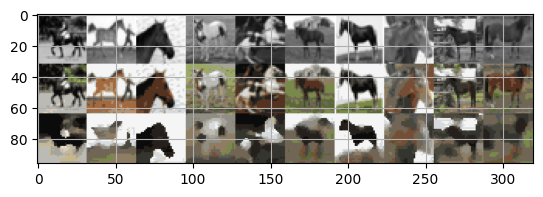

Epoch [1/25], Loss: 2.4723, Time (s): 9


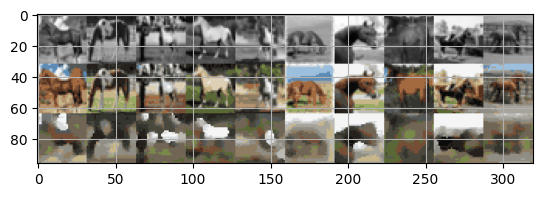

Epoch [1/25], Val Loss: 2.2191, Val Acc: 24.1%, Time(s): 10


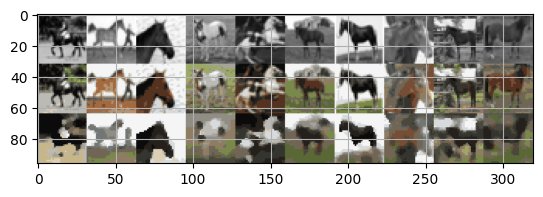

Epoch [2/25], Loss: 2.0075, Time (s): 21


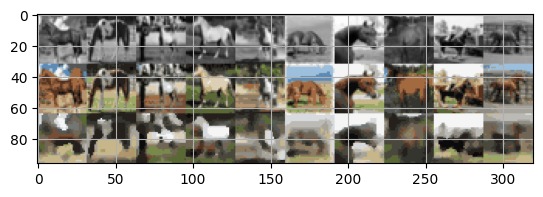

Epoch [2/25], Val Loss: 1.9399, Val Acc: 31.9%, Time(s): 22


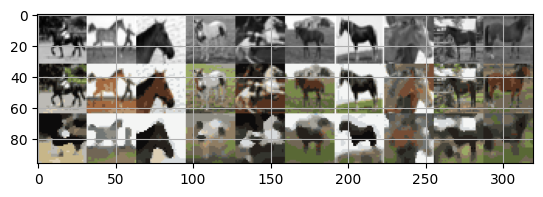

Epoch [3/25], Loss: 1.8781, Time (s): 34


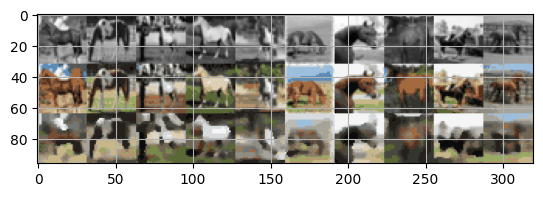

Epoch [3/25], Val Loss: 1.8260, Val Acc: 34.9%, Time(s): 35


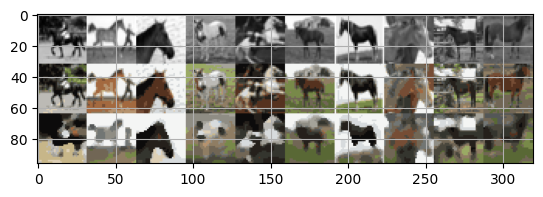

Epoch [4/25], Loss: 1.8080, Time (s): 47


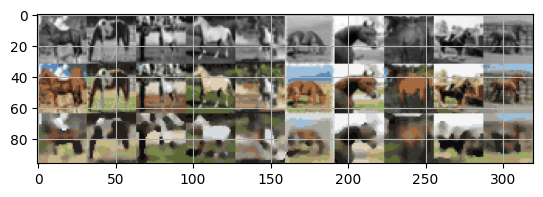

Epoch [4/25], Val Loss: 1.7605, Val Acc: 36.8%, Time(s): 48


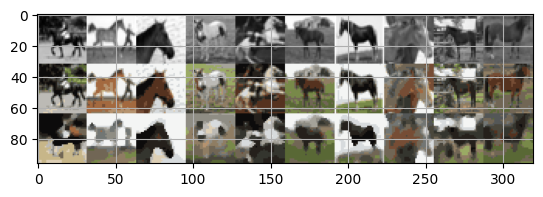

Epoch [5/25], Loss: 1.7632, Time (s): 61


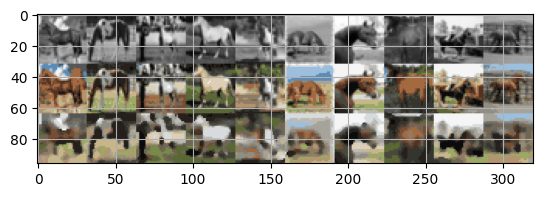

Epoch [5/25], Val Loss: 1.7237, Val Acc: 37.7%, Time(s): 62


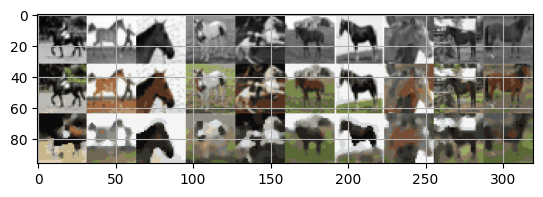

Epoch [6/25], Loss: 1.7312, Time (s): 79


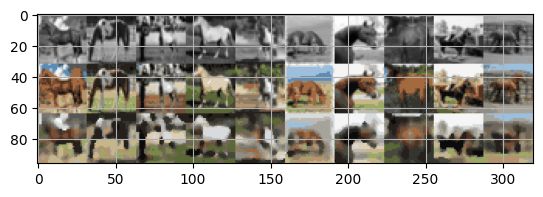

Epoch [6/25], Val Loss: 1.6993, Val Acc: 38.4%, Time(s): 81


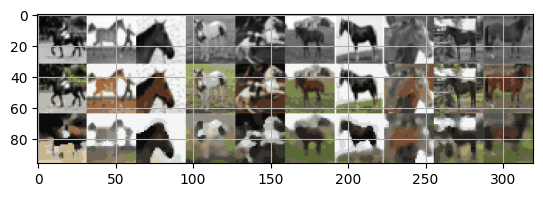

Epoch [7/25], Loss: 1.7071, Time (s): 99


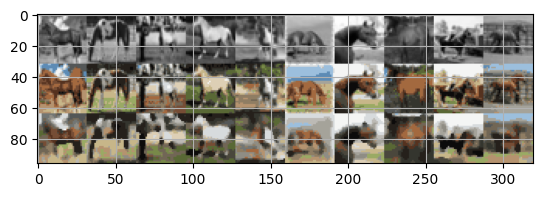

Epoch [7/25], Val Loss: 1.6813, Val Acc: 38.8%, Time(s): 101


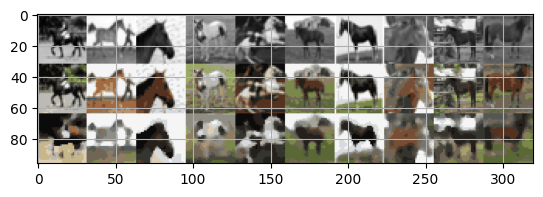

Epoch [8/25], Loss: 1.6875, Time (s): 119


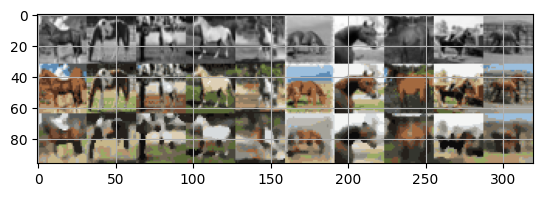

Epoch [8/25], Val Loss: 1.6634, Val Acc: 39.3%, Time(s): 121


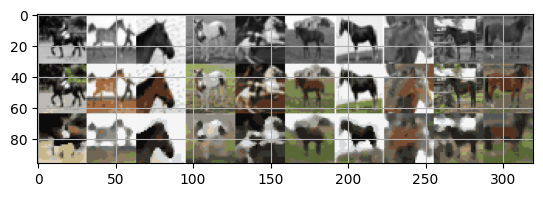

Epoch [9/25], Loss: 1.6712, Time (s): 137


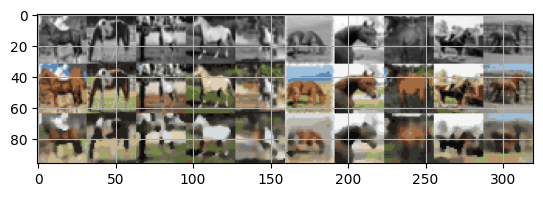

Epoch [9/25], Val Loss: 1.6468, Val Acc: 39.8%, Time(s): 139


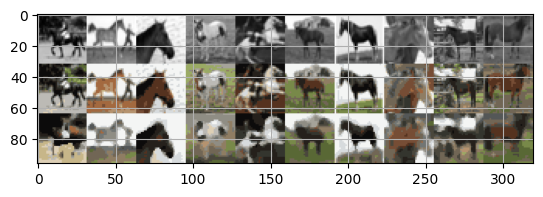

Epoch [10/25], Loss: 1.6571, Time (s): 157


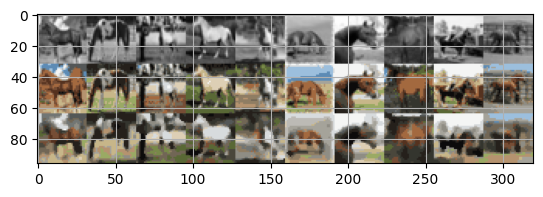

Epoch [10/25], Val Loss: 1.6370, Val Acc: 40.0%, Time(s): 159


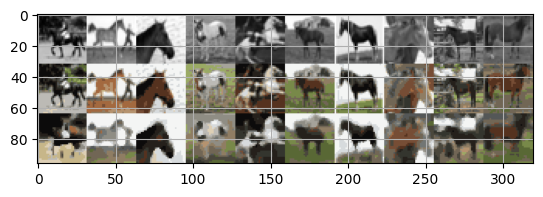

Epoch [11/25], Loss: 1.6450, Time (s): 174


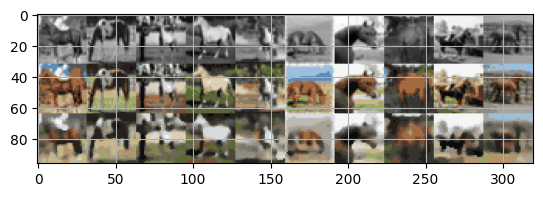

Epoch [11/25], Val Loss: 1.6311, Val Acc: 40.2%, Time(s): 175


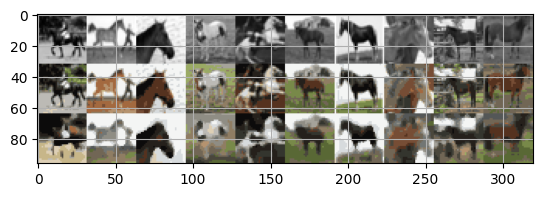

Epoch [12/25], Loss: 1.6342, Time (s): 194


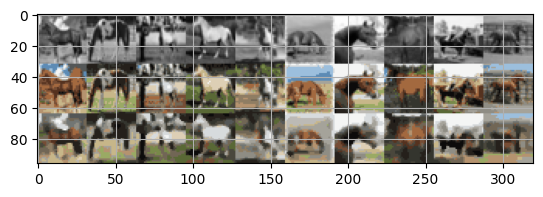

Epoch [12/25], Val Loss: 1.6201, Val Acc: 40.6%, Time(s): 196


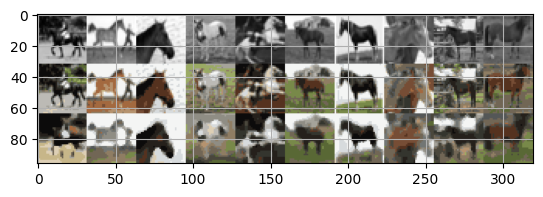

Epoch [13/25], Loss: 1.6246, Time (s): 209


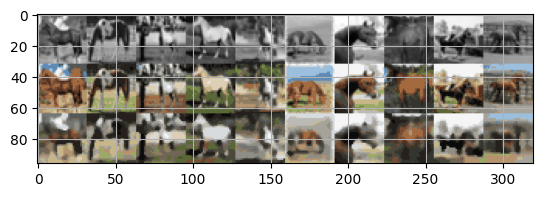

Epoch [13/25], Val Loss: 1.6224, Val Acc: 40.3%, Time(s): 210


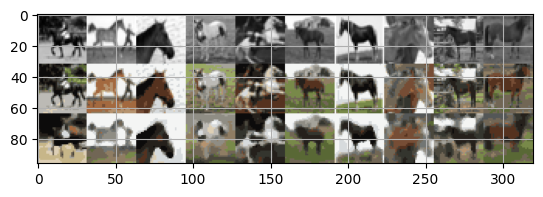

Epoch [14/25], Loss: 1.6159, Time (s): 223


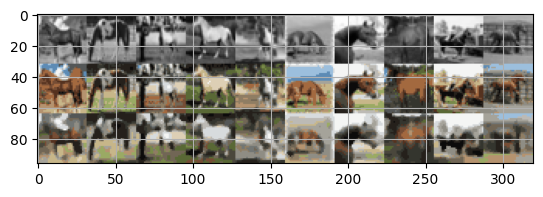

Epoch [14/25], Val Loss: 1.6109, Val Acc: 40.8%, Time(s): 224


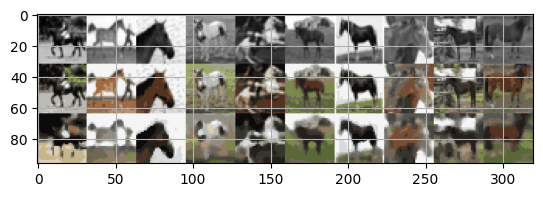

Epoch [15/25], Loss: 1.6076, Time (s): 238


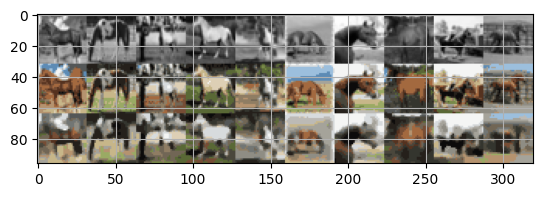

Epoch [15/25], Val Loss: 1.6102, Val Acc: 40.8%, Time(s): 240


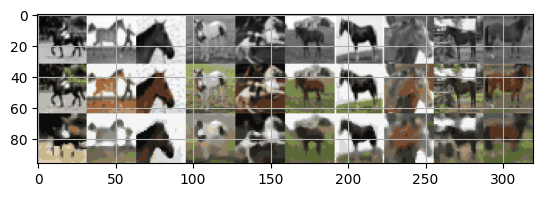

Epoch [16/25], Loss: 1.6001, Time (s): 254


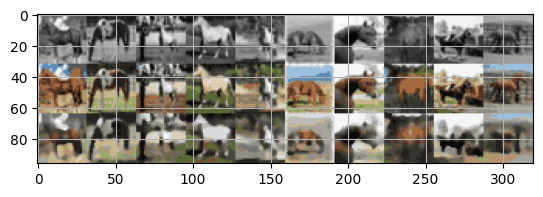

Epoch [16/25], Val Loss: 1.6047, Val Acc: 40.9%, Time(s): 256


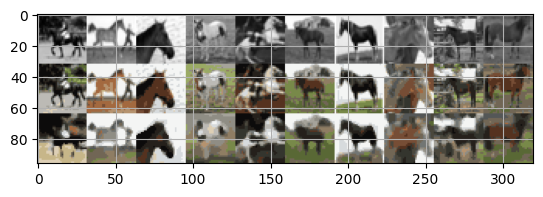

Epoch [17/25], Loss: 1.5931, Time (s): 274


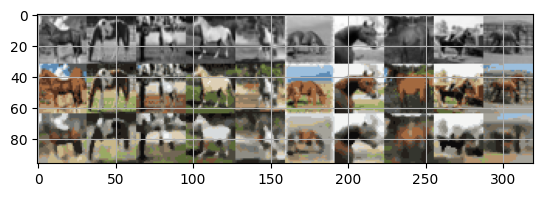

Epoch [17/25], Val Loss: 1.5942, Val Acc: 41.3%, Time(s): 275


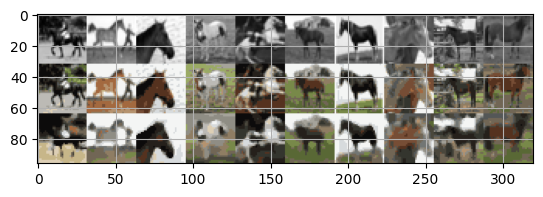

Epoch [18/25], Loss: 1.5866, Time (s): 288


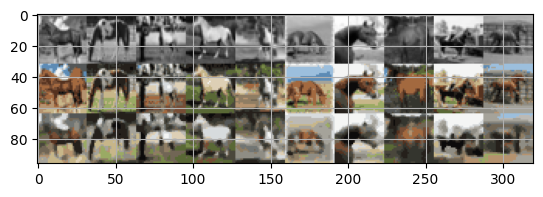

Epoch [18/25], Val Loss: 1.5893, Val Acc: 41.5%, Time(s): 289


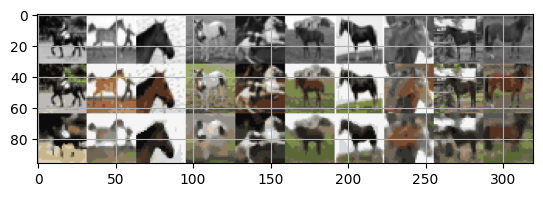

Epoch [19/25], Loss: 1.5802, Time (s): 306


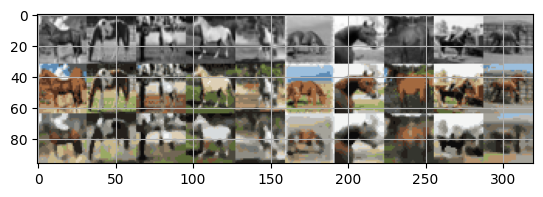

Epoch [19/25], Val Loss: 1.5867, Val Acc: 41.6%, Time(s): 308


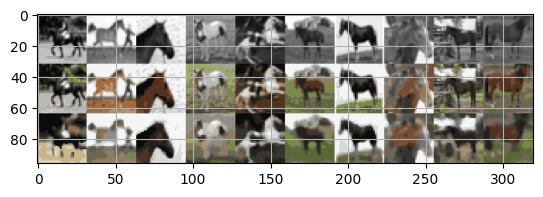

Epoch [20/25], Loss: 1.5744, Time (s): 322


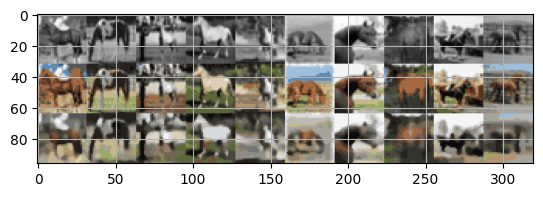

Epoch [20/25], Val Loss: 1.5878, Val Acc: 41.5%, Time(s): 324


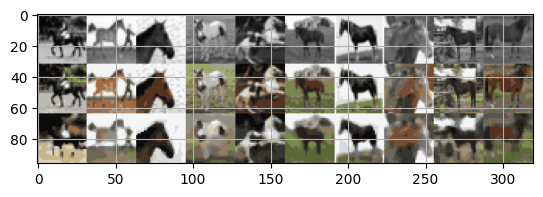

Epoch [21/25], Loss: 1.5688, Time (s): 340


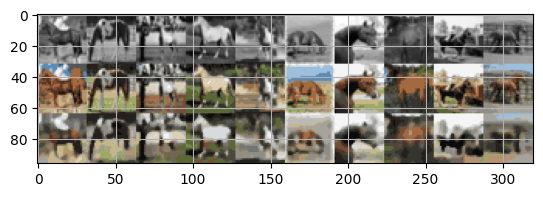

Epoch [21/25], Val Loss: 1.5832, Val Acc: 41.5%, Time(s): 341


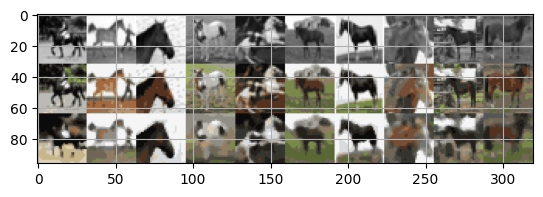

Epoch [22/25], Loss: 1.5639, Time (s): 353


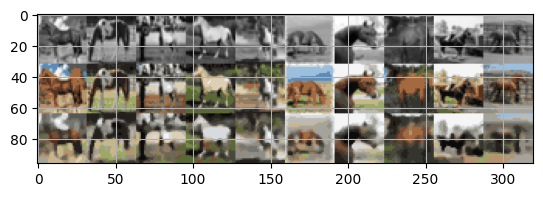

Epoch [22/25], Val Loss: 1.5773, Val Acc: 41.8%, Time(s): 354


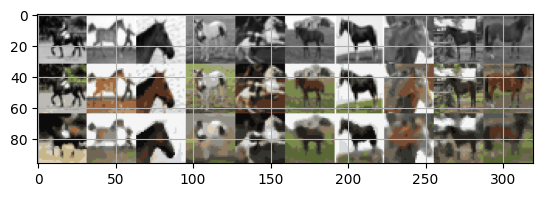

Epoch [23/25], Loss: 1.5591, Time (s): 367


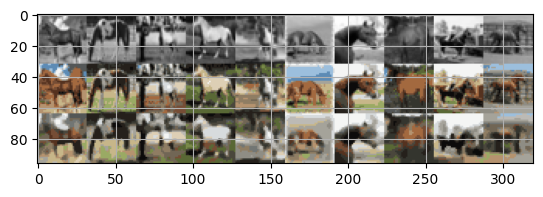

Epoch [23/25], Val Loss: 1.5749, Val Acc: 41.8%, Time(s): 369


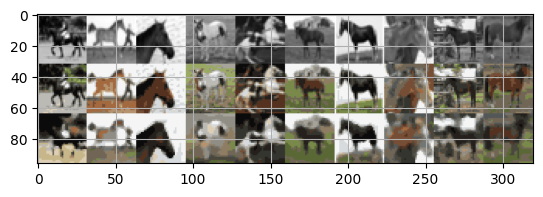

Epoch [24/25], Loss: 1.5546, Time (s): 385


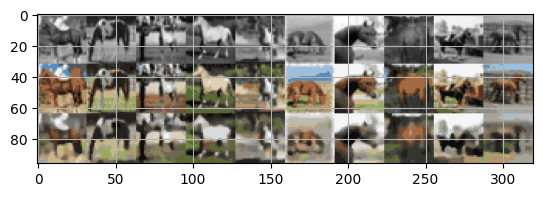

Epoch [24/25], Val Loss: 1.5709, Val Acc: 42.0%, Time(s): 386


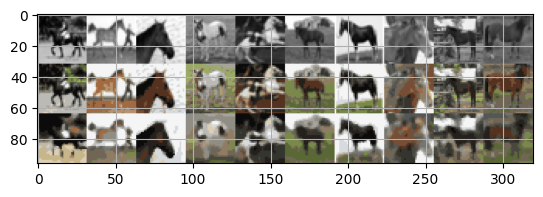

Epoch [25/25], Loss: 1.5503, Time (s): 400


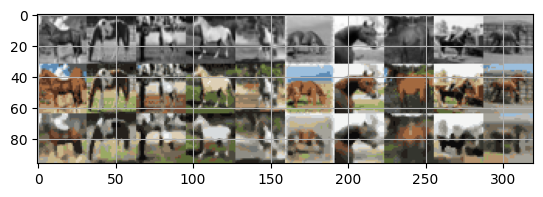

Epoch [25/25], Val Loss: 1.5681, Val Acc: 42.1%, Time(s): 402


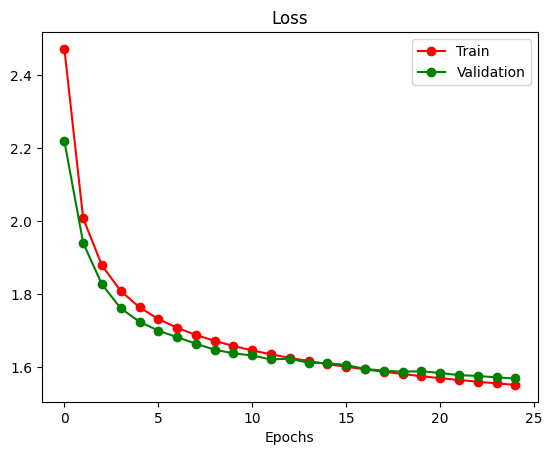

In [8]:
import torch
GPU_AVAILABLE = torch.cuda.is_available()
print(f'GPU: {GPU_AVAILABLE}')

args = AttrDict()
args_dict = {
              'gpu': GPU_AVAILABLE,
              'valid': False,
              'checkpoint': '',
              'colours': './data/colours/colour_kmeans24_cat7.npy',
              'model': 'CNN',
              'kernel': 3,
              'num_filters': 32,
              'learn_rate': 0.001,
              'batch_size': 100,
              'epochs': 25,
              'seed': 0,
              'plot': True,
              'experiment_name': 'colourization_cnn',
              'visualize': True,   # show plots inline in Jupyter
              'downsize_input': False,
}
args.update(args_dict)
cnn = train(args)


## Main training loop for UNet

c:\Users\navee\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\numpy\lib\_format_impl.py:838: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  array = pickle.load(fp, **pickle_kwargs)
C:\Users\navee\AppData\Local\Temp\ipykernel_27052\2782361662.py:70: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  d = pickle.load(f, encoding='bytes')


Loading data...
data\cifar-10-batches-py.tar.gz
Transforming data...
Beginning training ...


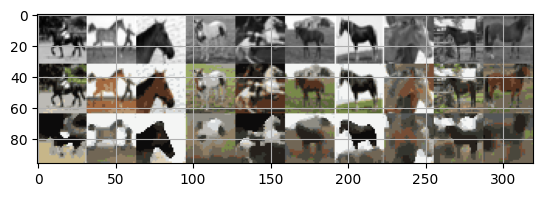

Epoch [1/25], Loss: 2.3470, Time (s): 16


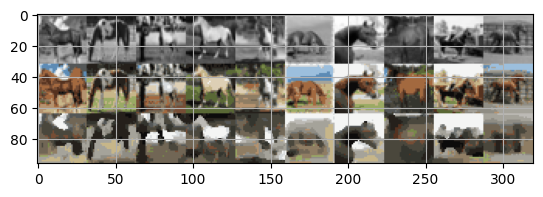

Epoch [1/25], Val Loss: 2.0503, Val Acc: 30.6%, Time(s): 18


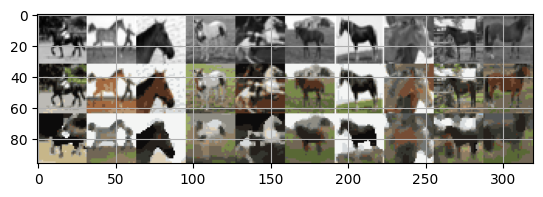

Epoch [2/25], Loss: 1.8616, Time (s): 30


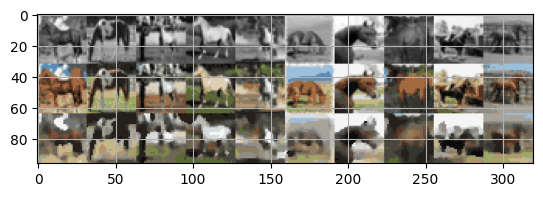

Epoch [2/25], Val Loss: 1.7796, Val Acc: 36.7%, Time(s): 32


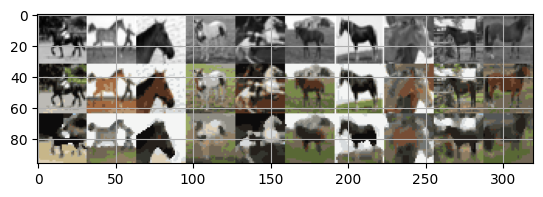

Epoch [3/25], Loss: 1.7182, Time (s): 43


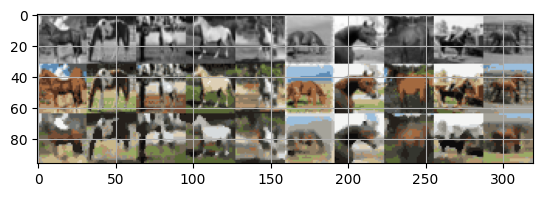

Epoch [3/25], Val Loss: 1.6626, Val Acc: 39.9%, Time(s): 44


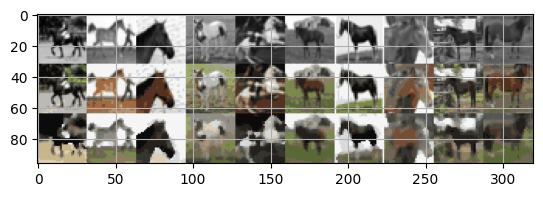

Epoch [4/25], Loss: 1.6434, Time (s): 56


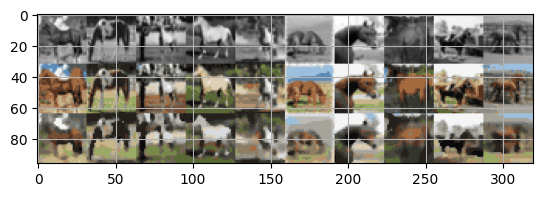

Epoch [4/25], Val Loss: 1.6082, Val Acc: 40.9%, Time(s): 57


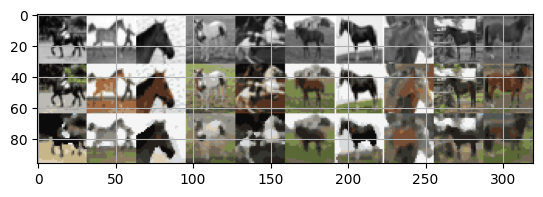

Epoch [5/25], Loss: 1.5934, Time (s): 75


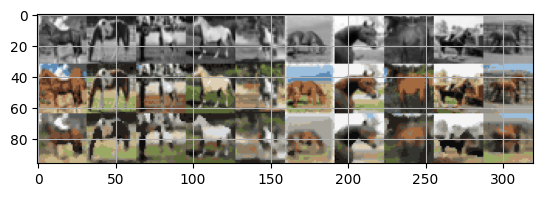

Epoch [5/25], Val Loss: 1.5679, Val Acc: 41.9%, Time(s): 77


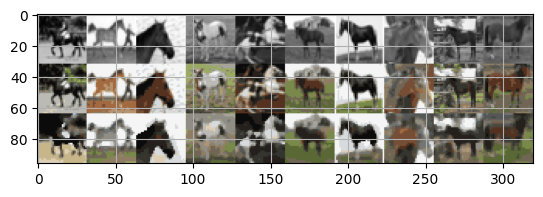

Epoch [6/25], Loss: 1.5560, Time (s): 91


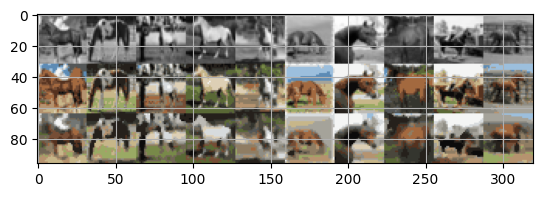

Epoch [6/25], Val Loss: 1.5403, Val Acc: 42.4%, Time(s): 92


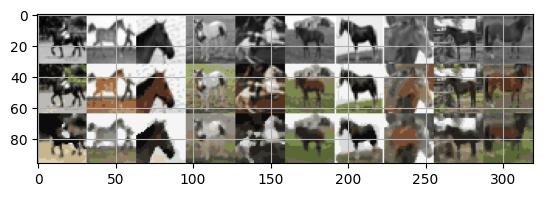

Epoch [7/25], Loss: 1.5239, Time (s): 108


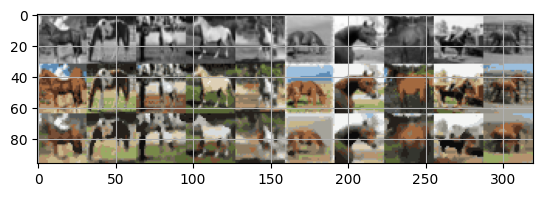

Epoch [7/25], Val Loss: 1.5265, Val Acc: 42.5%, Time(s): 110


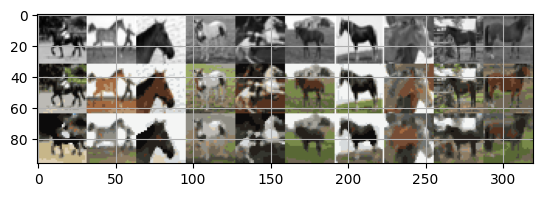

Epoch [8/25], Loss: 1.4965, Time (s): 126


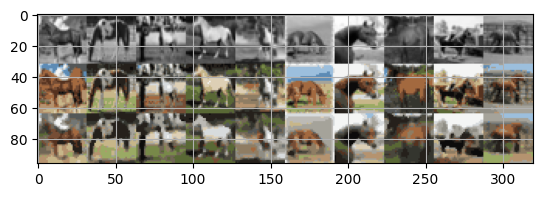

Epoch [8/25], Val Loss: 1.4849, Val Acc: 44.1%, Time(s): 127


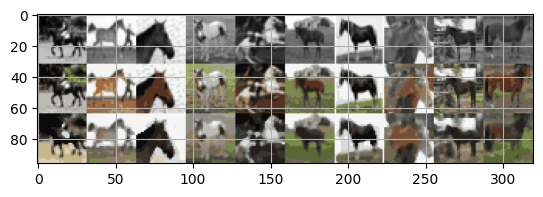

Epoch [9/25], Loss: 1.4734, Time (s): 143


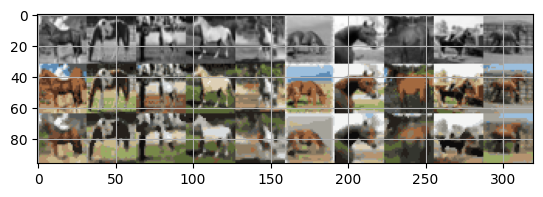

Epoch [9/25], Val Loss: 1.4697, Val Acc: 44.6%, Time(s): 145


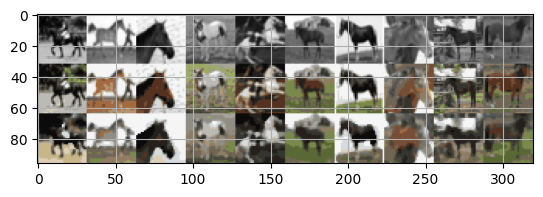

Epoch [10/25], Loss: 1.4530, Time (s): 159


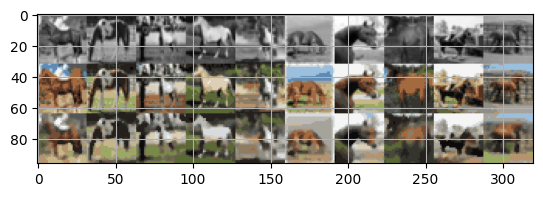

Epoch [10/25], Val Loss: 1.4442, Val Acc: 45.5%, Time(s): 161


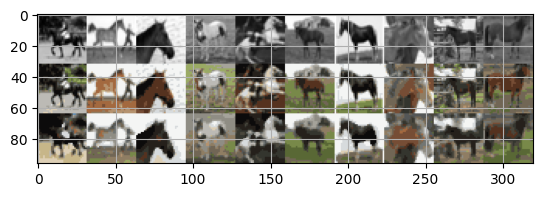

Epoch [11/25], Loss: 1.4350, Time (s): 175


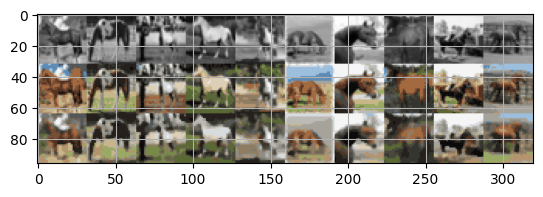

Epoch [11/25], Val Loss: 1.4263, Val Acc: 46.0%, Time(s): 177


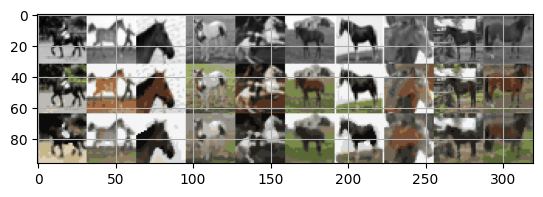

Epoch [12/25], Loss: 1.4182, Time (s): 190


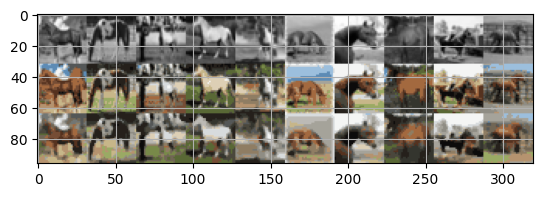

Epoch [12/25], Val Loss: 1.4150, Val Acc: 46.4%, Time(s): 192


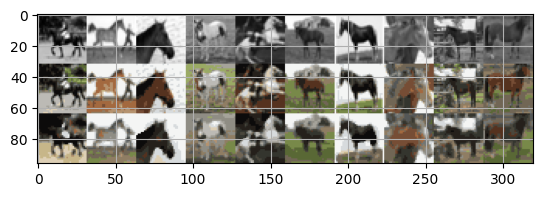

Epoch [13/25], Loss: 1.4020, Time (s): 205


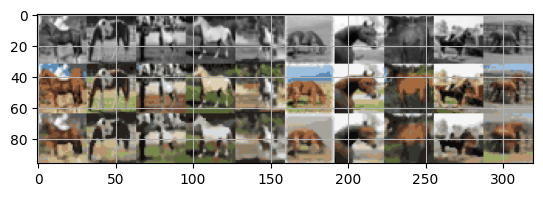

Epoch [13/25], Val Loss: 1.4092, Val Acc: 46.4%, Time(s): 207


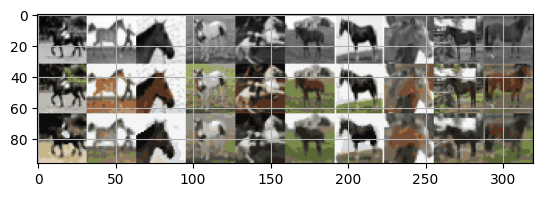

Epoch [14/25], Loss: 1.3880, Time (s): 220


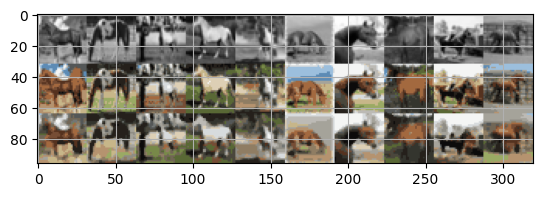

Epoch [14/25], Val Loss: 1.4060, Val Acc: 46.3%, Time(s): 222


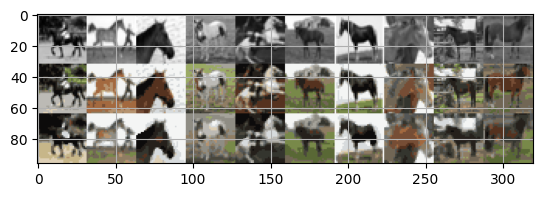

Epoch [15/25], Loss: 1.3734, Time (s): 237


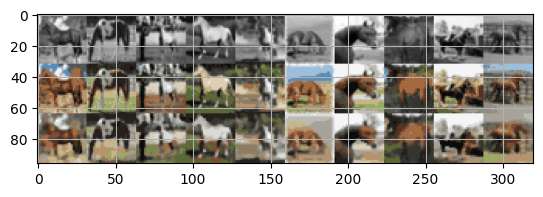

Epoch [15/25], Val Loss: 1.4135, Val Acc: 46.0%, Time(s): 238


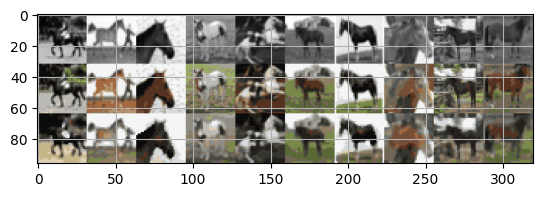

Epoch [16/25], Loss: 1.3599, Time (s): 251


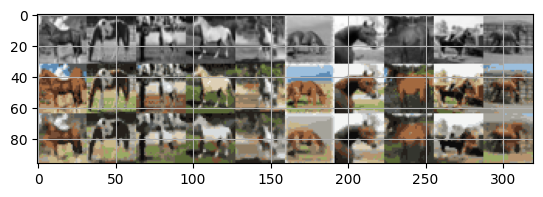

Epoch [16/25], Val Loss: 1.3893, Val Acc: 46.8%, Time(s): 253


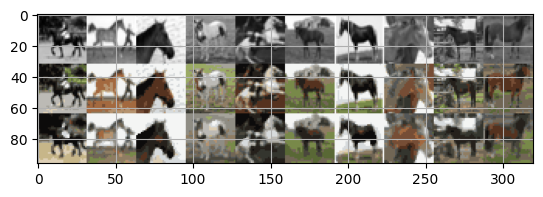

Epoch [17/25], Loss: 1.3473, Time (s): 268


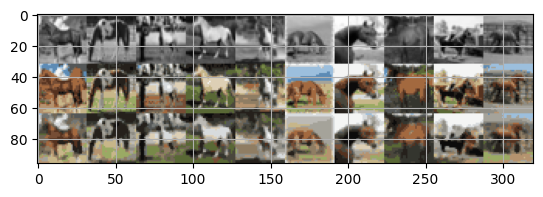

Epoch [17/25], Val Loss: 1.3713, Val Acc: 47.6%, Time(s): 269


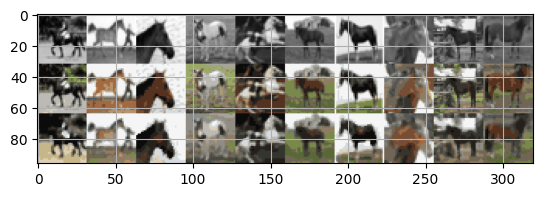

Epoch [18/25], Loss: 1.3355, Time (s): 287


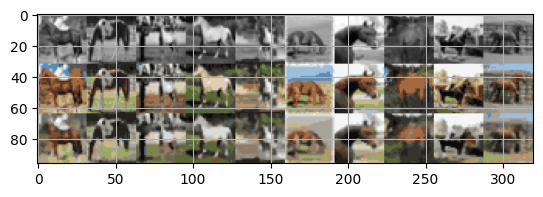

Epoch [18/25], Val Loss: 1.3594, Val Acc: 48.1%, Time(s): 288


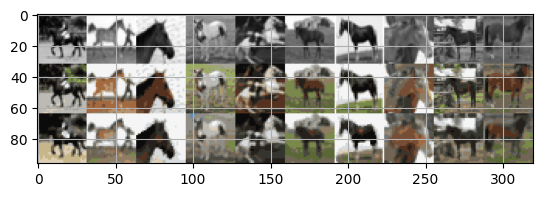

Epoch [19/25], Loss: 1.3240, Time (s): 305


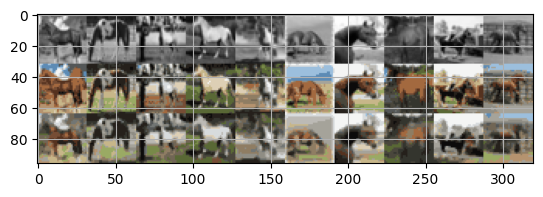

Epoch [19/25], Val Loss: 1.3557, Val Acc: 48.2%, Time(s): 307


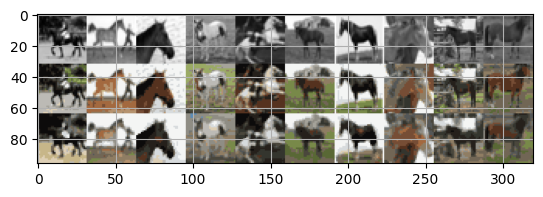

Epoch [20/25], Loss: 1.3126, Time (s): 327


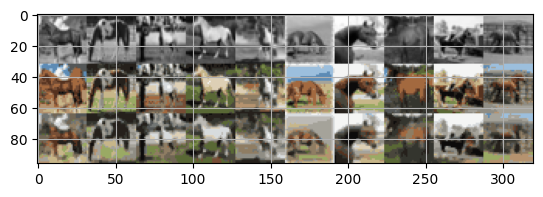

Epoch [20/25], Val Loss: 1.3522, Val Acc: 48.4%, Time(s): 329


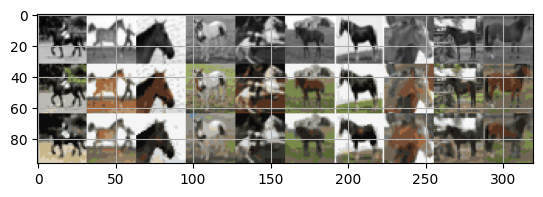

Epoch [21/25], Loss: 1.3018, Time (s): 345


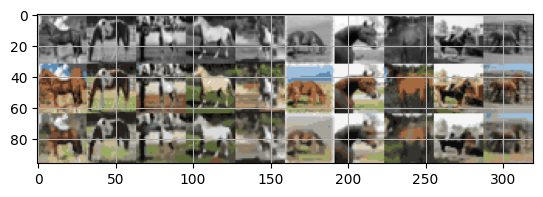

Epoch [21/25], Val Loss: 1.3409, Val Acc: 48.8%, Time(s): 347


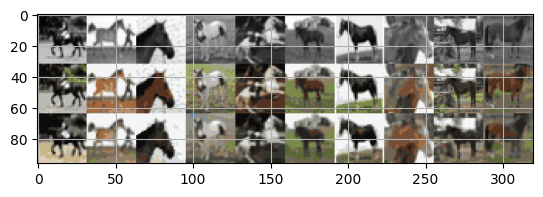

Epoch [22/25], Loss: 1.2914, Time (s): 362


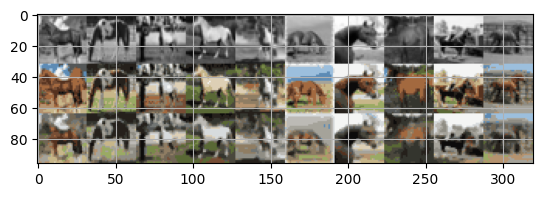

Epoch [22/25], Val Loss: 1.3358, Val Acc: 49.2%, Time(s): 364


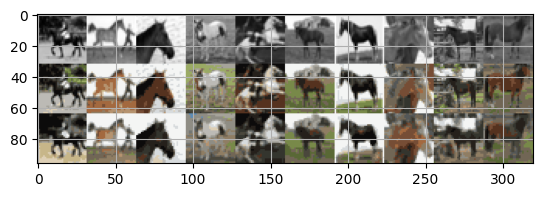

Epoch [23/25], Loss: 1.2814, Time (s): 380


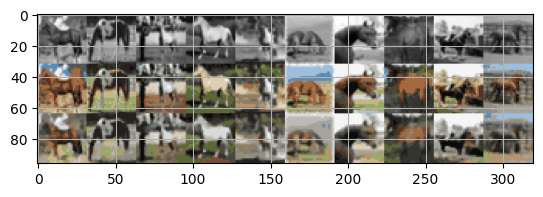

Epoch [23/25], Val Loss: 1.3324, Val Acc: 49.2%, Time(s): 382


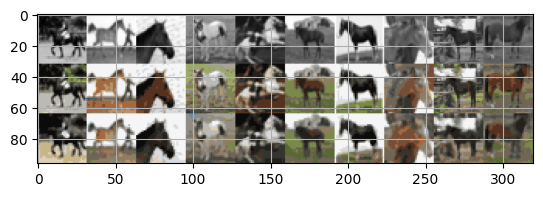

Epoch [24/25], Loss: 1.2719, Time (s): 398


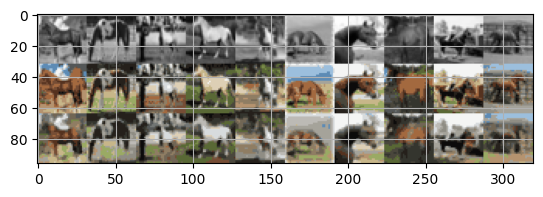

Epoch [24/25], Val Loss: 1.3321, Val Acc: 49.1%, Time(s): 400


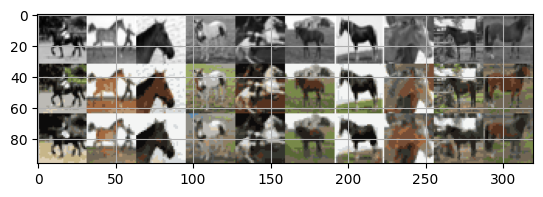

Epoch [25/25], Loss: 1.2626, Time (s): 417


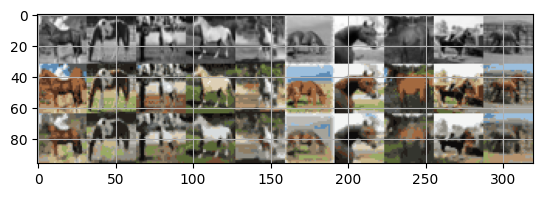

Epoch [25/25], Val Loss: 1.3304, Val Acc: 49.4%, Time(s): 418


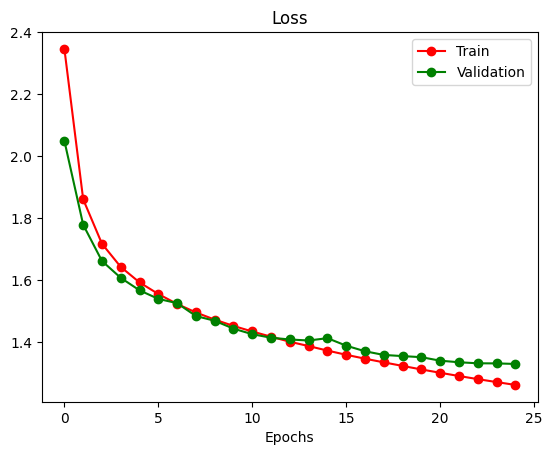

In [9]:
args = AttrDict()
args_dict = {
              'gpu': GPU_AVAILABLE,
              'valid': False,
              'checkpoint': '',
              'colours': './data/colours/colour_kmeans24_cat7.npy',
              'model': 'UNet',
              'kernel': 3,
              'num_filters': 32,
              'learn_rate': 0.001,
              'batch_size': 100,
              'epochs': 25,
              'seed': 0,
              'plot': True,
              'experiment_name': 'colourization_unet',
              'visualize': True,   # show plots inline in Jupyter
              'downsize_input': False,
}
args.update(args_dict)
unet_cnn = train(args)


## Main training loop

## Visualize CNN

In [10]:
args = AttrDict()
args_dict = {
              'colours': './data/colours/colour_kmeans24_cat7.npy',
              'index': 0,
              'experiment_name': 'colourization_cnn',
              'downsize_input': False,
}
args.update(args_dict)
plot_activation(args, cnn)


data\cifar-10-batches-py.tar.gz


C:\Users\navee\AppData\Local\Temp\ipykernel_27052\2782361662.py:70: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  d = pickle.load(f, encoding='bytes')


NameError: name 'scipy' is not defined

## Visualize UNet

In [ ]:
args = AttrDict()
args_dict = {
              'colours': './data/colours/colour_kmeans24_cat7.npy',
              'index': 0,
              'experiment_name': 'colourization_unet',
              'downsize_input': False,
}
args.update(args_dict)
plot_activation(args, unet_cnn)
